# 1. Imports

In [1]:
import torch
import matplotlib.pyplot as plt 

# 2. RoadMap

회귀분석 -> 로지스틱 -> 심층신경망(DNN) -> 합성곱신경망(CNN)

# 3. 회귀분석

`-` 목적은 아래와 같이 데이터들에 잘 맞는 회귀선을 찾는 것

In [2]:
torch.manual_seed(21345)
ones= torch.ones(100).reshape(-1,1)
x,_ = torch.randn(100).sort()
x = x.reshape(-1,1)
X = torch.concat([ones,x],axis=-1)
W = torch.tensor([[2.5],[4]])
ϵ = torch.randn(100).reshape(-1,1)*0.5
y = X@W + ϵ

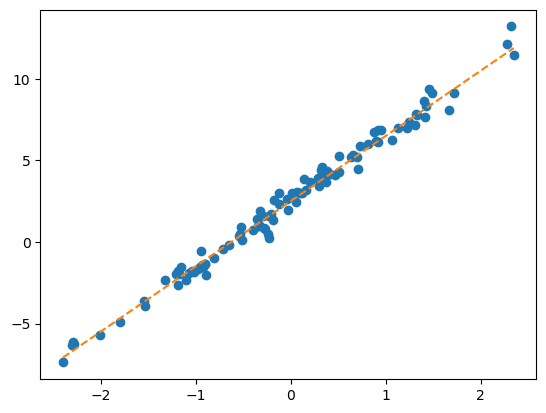

In [3]:
plt.plot(x,y,'o')
plt.plot(x,2.5+4*x,'--')

`-` 회귀모형에서 학습이란 위의 그림처럼 주황색 점선을 더 정확하게 추정하는 것

# 4. 학습

임의의 W값을 생각하자 그 다음 더 좋은 W값을 찾아서 업데이트 하면 되지 않을까?

`-` Step1 Data

데이터를 torch.tensor의 2차원 배열로 바꿔준다 .reshape(-1,1)을 사용 <- 행렬계산을 해야하기에 2차원배열로 바꾸는 것

`-` Step2 Update

업데이트를 할 건데 뭘 어떻게 좋게 만들 것인지 기준을 잡아야한다. -> Loss!(SSE)

회귀직선이 정확할 수록 Loss가 작다.

그렇다면 Loss값을 가장 작게 하는 W를 어떻게 찾을까?

Step2-1 update의 정도를 파악하고 수정하는 과정

1. 임의의 점 $\hat{w}$ 를 찍는다.

2. 2.loss(W)의 기울기를 계산
 
3. $\hat{w}$ - $\alpha$ $\frac{d}{dW}loss(W)$

Step2-2 $\hat{w}$ 수정

Wbefore = What.data

Wafter = What.data - $\alpha$ * What.grad

`-` Step3 미분

loss.backward()를 사용하면 What.grad()에 값이 생긴다. 곧 미분값

`-` Step4 iteration

for문을 사용하여 반복학습 해준다

# 각 Step의 변형

`-` Step2의 변형

MSELoss()를 이용한다.

`-` Step1의 변형

net오브젝트를 이용하여 원활한 학습을 위한 데이터 정리를 해준다.

`-` Step4의 변형

optimizer 오브젝트를 이용하여 학습을 진행한다.

In [7]:
temp = [-2.4821, -2.3621, -1.9973, -1.6239, -1.4792, -1.4635, -1.4509, -1.4435,
        -1.3722, -1.3079, -1.1904, -1.1092, -1.1054, -1.0875, -0.9469, -0.9319,
        -0.8643, -0.7858, -0.7549, -0.7421, -0.6948, -0.6103, -0.5830, -0.5621,
        -0.5506, -0.5058, -0.4806, -0.4738, -0.4710, -0.4676, -0.3874, -0.3719,
        -0.3688, -0.3159, -0.2775, -0.2772, -0.2734, -0.2721, -0.2668, -0.2155,
        -0.2000, -0.1816, -0.1708, -0.1565, -0.1448, -0.1361, -0.1057, -0.0603,
        -0.0559, -0.0214,  0.0655,  0.0684,  0.1195,  0.1420,  0.1521,  0.1568,
         0.2646,  0.2656,  0.3157,  0.3220,  0.3461,  0.3984,  0.4190,  0.5443,
         0.5579,  0.5913,  0.6148,  0.6469,  0.6469,  0.6523,  0.6674,  0.7059,
         0.7141,  0.7822,  0.8154,  0.8668,  0.9291,  0.9804,  0.9853,  0.9941,
         1.0376,  1.0393,  1.0697,  1.1024,  1.1126,  1.1532,  1.2289,  1.3403,
         1.3494,  1.4279,  1.4994,  1.5031,  1.5437,  1.6789,  2.0832,  2.2444,
         2.3935,  2.6056,  2.6057,  2.6632]
sales= [-8.5420, -6.5767, -5.9496, -4.4794, -4.2516, -3.1326, -4.0239, -4.1862,
        -3.3403, -2.2027, -2.0262, -2.5619, -1.3353, -2.0466, -0.4664, -1.3513,
        -1.6472, -0.1089, -0.3071, -0.6299, -0.0438,  0.4163,  0.4166, -0.0943,
         0.2662,  0.4591,  0.8905,  0.8998,  0.6314,  1.3845,  0.8085,  1.2594,
         1.1211,  1.9232,  1.0619,  1.3552,  2.1161,  1.1437,  1.6245,  1.7639,
         1.6022,  1.7465,  0.9830,  1.7824,  2.1116,  2.8621,  2.1165,  1.5226,
         2.5572,  2.8361,  3.3956,  2.0679,  2.8140,  3.4852,  3.6059,  2.5966,
         2.8854,  3.9173,  3.6527,  4.1029,  4.3125,  3.4026,  3.2180,  4.5686,
         4.3772,  4.3075,  4.4895,  4.4827,  5.3170,  5.4987,  5.4632,  6.0328,
         5.2842,  5.0539,  5.4538,  6.0337,  5.7250,  5.7587,  6.2020,  6.5992,
         6.4621,  6.5140,  6.6846,  7.3497,  8.0909,  7.0794,  6.8667,  7.4229,
         7.2544,  7.1967,  9.5006,  9.0339,  7.4887,  9.0759, 11.0946, 10.3260,
        12.2665, 13.0983, 12.5468, 13.8340]
x = torch.tensor(temp).reshape(-1,1)
ones = torch.ones(100).reshape(-1,1)
X = torch.concat([ones,x],axis=1)
y = torch.tensor(sales).reshape(-1,1)

net = torch.nn.Linear(
    in_features=2,
    out_features=1,
    bias=False
)
net.weight.data = torch.tensor([[-5.0,  10.0]])

loss_fn = torch.nn.MSELoss()

optimizr = torch.optim.SGD(net.parameters(),lr=0.1)
for epoc in range(30):
    # step1: yhat 
    yhat = net(X)
    # step2: loss
    loss = loss_fn(yhat,y)
    # step3: 미분
    loss.backward()
    # step4: update
    optimizr.step()
    optimizr.zero_grad()

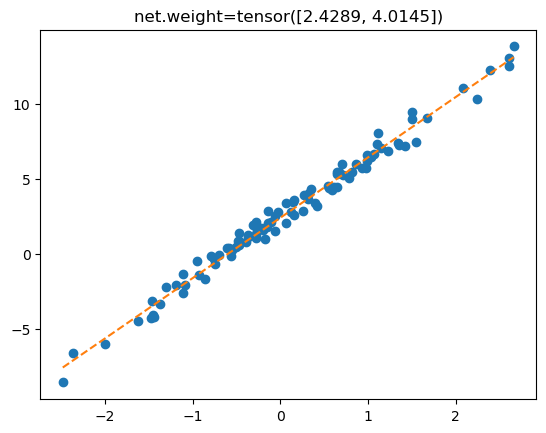

In [8]:
plt.plot(x,y,'o')
plt.plot(x,yhat.data,'--')
plt.title(f'net.weight={net.weight.data.reshape(-1)}');

# 5. 로지스틱

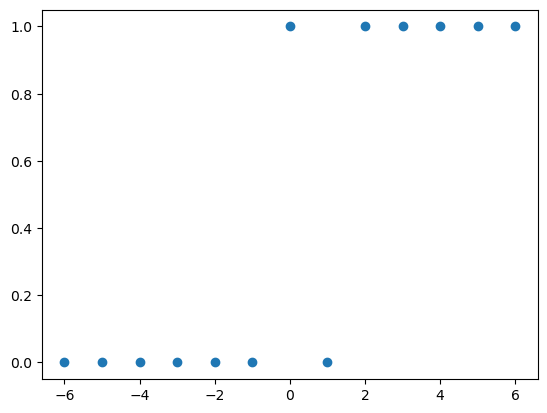

In [9]:
x = torch.tensor([-6,-5,-4,-3,-2,-1, 0, 1, 2, 3, 4, 5, 6.0]).reshape(-1,1)
y = torch.tensor([ 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1]).reshape(-1,1)
plt.plot(x,y,'o')

`-` 위와 같은 범주형 문제는 이전의 문제처럼 회귀문제로 생각하는 건 쉽지 않아 보인다. 로지스틱으로 해볼까?

우리가 예측하고 싶은 건 underlying이다.

In [12]:
x = torch.linspace(-1,1,2000).reshape(2000,1)
w0 = -1
w1 = 5
u = w0 + x*w1 # 선형변환이네?
v = torch.exp(u) / (1+torch.exp(u)) 
y = torch.bernoulli(v)

net = torch.nn.Sequential(
    torch.nn.Linear(in_features=1, out_features=1),
    torch.nn.Sigmoid()
)
l1, a1 = net # 네트워크는 섭스크립터블 오브젝트이니까..
l1.weight.data = torch.tensor([[-0.3]])
l1.bias.data = torch.tensor([-0.8])
#loss_fn = torch.nn.MSELoss() # -- 이 코드 일단 쓰지 않을게여
optimizr = torch.optim.SGD(net.parameters(),lr=0.25)
#---#
for epoc in range(100):
    ## 1
    yhat = net(x) 
    ## 2 
    loss = torch.mean((y-yhat)**2)
    ## 3
    loss.backward()
    ## 4 
    optimizr.step()
    optimizr.zero_grad()

Text(0.5, 1.0, 'after 100 epochs')

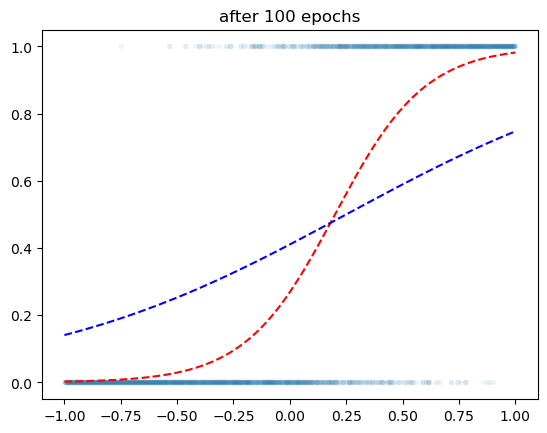

In [13]:
plt.plot(x,y,'.',alpha=0.05)
plt.plot(x,v,'--r')
plt.plot(x,yhat.data,'--b')
plt.title('after 100 epochs')

5000번 학습하면?

In [14]:
x = torch.linspace(-1,1,2000).reshape(2000,1)
w0 = -1
w1 = 5
u = w0 + x*w1 # 선형변환이네?
v = torch.exp(u) / (1+torch.exp(u)) 
y = torch.bernoulli(v)

net = torch.nn.Sequential(
    torch.nn.Linear(in_features=1, out_features=1),
    torch.nn.Sigmoid()
)
l1, a1 = net # 네트워크는 섭스크립터블 오브젝트이니까..
l1.weight.data = torch.tensor([[-0.3]])
l1.bias.data = torch.tensor([-0.8])
#loss_fn = torch.nn.MSELoss() # -- 이 코드 일단 쓰지 않을게여
optimizr = torch.optim.SGD(net.parameters(),lr=0.25)
#---#
for epoc in range(5000):
    ## 1
    yhat = net(x) 
    ## 2 
    loss = torch.mean((y-yhat)**2)
    ## 3
    loss.backward()
    ## 4 
    optimizr.step()
    optimizr.zero_grad()

Text(0.5, 1.0, 'after 100 epochs')

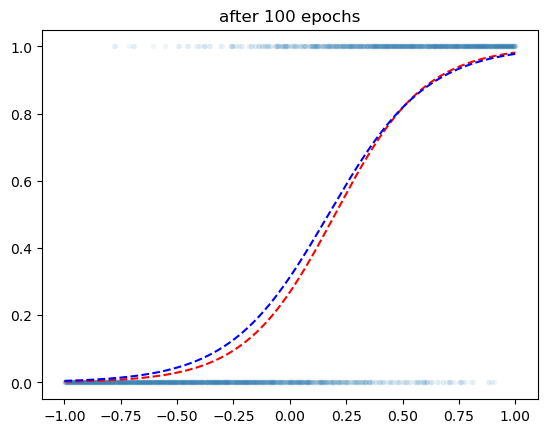

In [15]:
plt.plot(x,y,'.',alpha=0.05)
plt.plot(x,v,'--r')
plt.plot(x,yhat.data,'--b')
plt.title('after 100 epochs')

그런데 우리가 초기값을 -0.8,-0.3 으로 운 좋게 잘 잡아서 적합이 이렇게 잘 된 거 아닐까?

안 좋은 초기값을 잡으면 어떻게 될까? 그래도 적합 시켜줄까?

In [22]:
import torch
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd

def plot_loss(loss_fn, ax=None, Wstar=[-1,5]):
    w0hat,w1hat =torch.meshgrid(torch.arange(-10,3,0.1),torch.arange(-1,10,0.1),indexing='ij')
    w0hat = w0hat.reshape(-1)
    w1hat = w1hat.reshape(-1)
    def l(w0hat,w1hat):
        yhat = torch.exp(w0hat+w1hat*x)/(1+torch.exp(w0hat+w1hat*x))
        return loss_fn(yhat,y) 
    loss = list(map(l,w0hat,w1hat))
    #---#
    if ax is None: 
        fig = plt.figure()
        ax = fig.add_subplot(1,1,1,projection='3d')
    ax.scatter(w0hat,w1hat,loss,s=0.001) 
    ax.scatter(w0hat[::20],w1hat[::20],loss[::20],s=0.1,color='C0') 
    w0star,w1star = np.array(Wstar).reshape(-1)
    ax.scatter(w0star,w1star,l(w0star,w1star),s=200,marker='*',color='red',label=f"W=[{w0star:.1f},{w1star:.1f}]")
    #---#
    ax.elev = 15
    ax.dist = -20
    ax.azim = 75    
    ax.legend()
    ax.set_xlabel(r'$w_0$')  # x축 레이블 설정
    ax.set_ylabel(r'$w_1$')  # y축 레이블 설정
    ax.set_xticks([-10,-5,0])  # x축 틱 간격 설정
    ax.set_yticks([-10,0,10])  # y축 틱 간격 설정

In [19]:
def learn_and_record(net, loss_fn, optimizr):
    yhat_history = [] 
    loss_history = []
    What_history = []
    Whatgrad_history = []
    What_history.append([net[0].bias.data.item(), net[0].weight.data.item()])
    for epoc in range(100): 
        ## step1 
        yhat = net(x)
        ## step2 
        loss = loss_fn(yhat,y)
        ## step3
        loss.backward() 
        ## step4 
        optimizr.step()
        ## record 
        if epoc % 5 ==0: 
            yhat_history.append(yhat.reshape(-1).data.tolist())
            loss_history.append(loss.item())
            What_history.append([net[0].bias.data.item(), net[0].weight.data.item()])
            Whatgrad_history.append([net[0].bias.grad.item(), net[0].weight.grad.item()])
        optimizr.zero_grad() 
        
    return yhat_history, loss_history, What_history, Whatgrad_history

In [20]:
def show_animation(net, loss_fn, optimizr):
    yhat_history,loss_history,What_history,Whatgrad_history = learn_and_record(net,loss_fn,optimizr)
    
    fig = plt.figure(figsize=(7.5,3.5))
    ax1 = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    ## ax1: 왼쪽그림 
    ax1.scatter(x,y,alpha=0.01)
    ax1.scatter(x[0],y[0],color='C0',label=r"observed data = $(x_i,y_i)$")
    ax1.plot(x,v,'--',label=r"prob (true) = $(x_i,\frac{exp(-1+5x_i)}{1+exp(-1+5x_i)})$")    
    line, = ax1.plot(x,yhat_history[0],'--',label=r"prob (estimated) = $(x_i,\hat{y}_i)$") 
    ax1.legend()
    ## ax2: 오른쪽그림 
    plot_loss(loss_fn,ax2)
    ax2.scatter(np.array(What_history)[0,0],np.array(What_history)[0,1],loss_history[0],color='blue',s=200,marker='*')    
    def animate(epoc):
        line.set_ydata(yhat_history[epoc])
        w0hat = np.array(What_history)[epoc,0]
        w1hat = np.array(What_history)[epoc,1]
        w0hatgrad = np.array(Whatgrad_history)[epoc,0]
        w1hatgrad = np.array(Whatgrad_history)[epoc,1]
        ax2.scatter(w0hat,w1hat,loss_history[epoc],color='grey')
        ax2.set_title(f"What.grad=[{w0hatgrad:.4f},{w1hatgrad:.4f}]",y=0.8)
        fig.suptitle(f"epoch={epoc*5} // What=[{w0hat:.2f},{w1hat:.2f}] // Loss={loss_fn.__class__.__name__} // Opt={optimizr.__class__.__name__}")
        return line
    ani = animation.FuncAnimation(fig, animate, frames=20)    
    plt.close()
    return ani

`-` 좋은 초기값

In [23]:
from matplotlib import animation
plt.rcParams["animation.html"] = "jshtml"

net = torch.nn.Sequential(
    torch.nn.Linear(1,1),
    torch.nn.Sigmoid()
) 
net[0].bias.data = torch.tensor([-0.8])
net[0].weight.data = torch.tensor([[-0.3]])
loss_fn = torch.nn.MSELoss()
optimizr = torch.optim.SGD(net.parameters(),lr=0.25) 
#---#
show_animation(net,loss_fn,optimizr)

`-` 최악의 초기값

In [24]:
net = torch.nn.Sequential(
    torch.nn.Linear(1,1),
    torch.nn.Sigmoid()
) 
net[0].bias.data = torch.tensor([-10.0])
net[0].weight.data = torch.tensor([[-1.0]])
loss_fn = torch.nn.MSELoss()
optimizr = torch.optim.SGD(net.parameters(),lr=0.25) 
#---#
show_animation(net,loss_fn,optimizr)

`-` 해결 접근법

컴공 : 에폭을 늘릴까?

산공 : 옵티마이저를 바꿀까?

통계 : Loss를 바꿀까?

# 손실함수의 개선

Loss 중 BCELoss라는 것이 있는데 이것은 반복을 했을 때 원하는 만큼 움직이지 않는다면 가속도를 붙혀서 그 다음 반복시에는 더 많이 움직이게끔 방식이다.

여기서 움직이게 한다는 건 Loss를 줄여서 적합을 시킨다는 의미이다.

사용방법은 loss를 선언할 때 BCELoss() 라고 쓰면 된다

In [26]:
net = torch.nn.Sequential(
    torch.nn.Linear(in_features=1, out_features=1),
    torch.nn.Sigmoid()
)
l1, a1 = net # 네트워크는 섭스크립터블 오브젝트이니까..
l1.weight.data = torch.tensor([[-0.3]])
l1.bias.data = torch.tensor([-0.8])
loss_fn = torch.nn.BCELoss()
optimizr = torch.optim.SGD(net.parameters(),lr=0.25)
#---#
for epoc in range(100):
    ## 1
    yhat = net(x) 
    ## 2 
    loss = loss_fn(yhat,y) # yhat부터 써야함
    ## 3
    loss.backward()
    ## 4 
    optimizr.step()
    optimizr.zero_grad()

Text(0.5, 1.0, 'after 100 epochs')

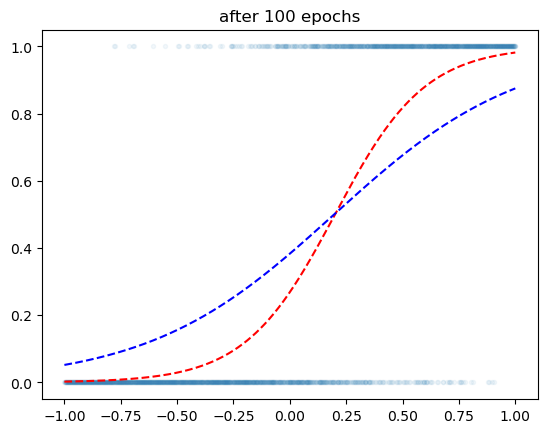

In [27]:
plt.plot(x,y,'.',alpha=0.05)
plt.plot(x,v,'--r')
plt.plot(x,yhat.data,'--b')
plt.title('after 100 epochs')

`-` MSELoss를 사용할 때보다 BCELoss를 사용했을 때 훨씬 더 적합이 되는 듯한 느낌이다.

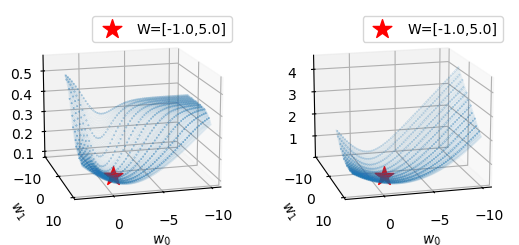

In [28]:
fig = plt.figure()
ax1 = fig.add_subplot(1,2,1,projection='3d')
ax2 = fig.add_subplot(1,2,2,projection='3d')
plot_loss(torch.nn.MSELoss(),ax1)
plot_loss(torch.nn.BCELoss(),ax2)

뭔가 더 잘 떨어지게끔 오른쪽이 미끄럼틀같이 펴져있다.

`-` MSELoss

In [29]:
net = torch.nn.Sequential(
    torch.nn.Linear(1,1),
    torch.nn.Sigmoid()
) 
net[0].bias.data = torch.tensor([-0.8])
net[0].weight.data = torch.tensor([[-0.3]])
loss_fn = torch.nn.MSELoss()
optimizr = torch.optim.SGD(net.parameters(),lr=0.25) 
#---#
show_animation(net,loss_fn,optimizr)

`-` BCELoss

In [31]:
net = torch.nn.Sequential(
    torch.nn.Linear(1,1),
    torch.nn.Sigmoid()
) 
net[0].bias.data = torch.tensor([-0.8])
net[0].weight.data = torch.tensor([[-0.3]])
loss_fn = torch.nn.BCELoss()
optimizr = torch.optim.SGD(net.parameters(),lr=0.25) 
#---#
show_animation(net,loss_fn,optimizr)

# 옵티마이저의 개선

국민옵티마이저 Adam이 있다. 웬만하면 이거 쓰면 된다.

`-` MSELoss + SGD

In [34]:
net = torch.nn.Sequential(
    torch.nn.Linear(1,1),
    torch.nn.Sigmoid()
) 
net[0].bias.data = torch.tensor([-10.0])
net[0].weight.data = torch.tensor([[-1.0]])
loss_fn = torch.nn.MSELoss()
optimizr = torch.optim.SGD(net.parameters(),lr=0.05) 
#---#
show_animation(net,loss_fn,optimizr)

꿈쩍도 하지 않는 모습...

`-` MSELoss + Adam

In [35]:
net = torch.nn.Sequential(
    torch.nn.Linear(1,1),
    torch.nn.Sigmoid()
) 
net[0].bias.data = torch.tensor([-10.0])
net[0].weight.data = torch.tensor([[-1.0]])
loss_fn = torch.nn.MSELoss()
optimizr = torch.optim.Adam(net.parameters(),lr=0.25) 
#---#
show_animation(net,loss_fn,optimizr)

너무나도 뚝뚝 잘 내려온다

`-` 그럼 BCELoss + Adam 쓰면 무적인가?

# 6.로지스틱의 한계

중소·지방 기업 “뽑아봤자 그만두니까”

중소기업 관계자들은 고스펙 지원자를 꺼리는 이유로 높은 퇴직률을 꼽는다. 여건이 좋은 대기업으로 이직하거나 회사를 관두는 경우가 많다는 하소연이다. 고용정보원이 지난 3일 공개한 자료에 따르면 중소기업 청년취업자 가운데 49.5%가 2년 내에 회사를 그만두는 것으로 나타났다.

중소 IT업체 관계자는 “기업 입장에서 가장 뼈아픈 게 신입사원이 그만둬서 새로 뽑는 일”이라며 “명문대 나온 스펙 좋은 지원자를 뽑아놔도 1년을 채우지 않고 그만두는 사원이 대부분이라 우리도 눈을 낮춰 사람을 뽑는다”고 말했다.

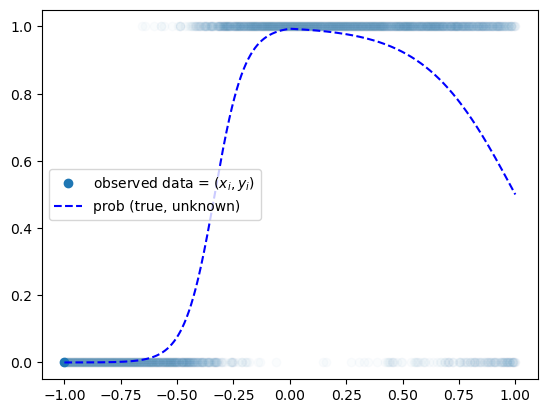

In [36]:
df = pd.read_csv("https://raw.githubusercontent.com/guebin/DL2024/main/posts/dnnex.csv")
x = torch.tensor(df.x).float().reshape(-1,1)
y = torch.tensor(df.y).float().reshape(-1,1)
prob = torch.tensor(df.prob).float().reshape(-1,1)
plt.plot(x,y,'o',alpha=0.02)
plt.plot(x[0],y[0],'o',label= r"observed data = $(x_i,y_i)$",color="C0")
plt.plot(x,prob,'--b',label= r"prob (true, unknown)")
plt.legend()

`-` 이런 꺾인 선은 로지스틱으로 적합하기 힘들어...

In [37]:
net = torch.nn.Sequential(
    torch.nn.Linear(1,1),
    torch.nn.Sigmoid()
)
loss_fn = torch.nn.BCELoss()
optimizr = torch.optim.Adam(net.parameters())
#---# 
for epoc in range(5000):
    ## 1 
    yhat = net(x)
    ## 2 
    loss = loss_fn(yhat,y)
    ## 3 
    loss.backward()
    ## 4 
    optimizr.step()
    optimizr.zero_grad()

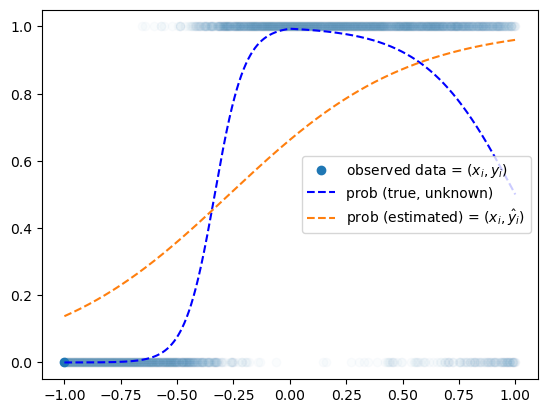

In [38]:
plt.plot(x,y,'o',alpha=0.02)
plt.plot(x[0],y[0],'o',label= r"observed data = $(x_i,y_i)$",color="C0")
plt.plot(x,prob,'--b',label= r"prob (true, unknown)")
plt.plot(x,net(x).data, '--', label= r"prob (estimated) = $(x_i,\hat{y}_i)$")
plt.legend()

# 7.로지스틱의 한계 극복

ReLU : 음수인 것은 0으로 만들고 양수는 그대로 둔다. 그럼 그래프가 꺾인다.

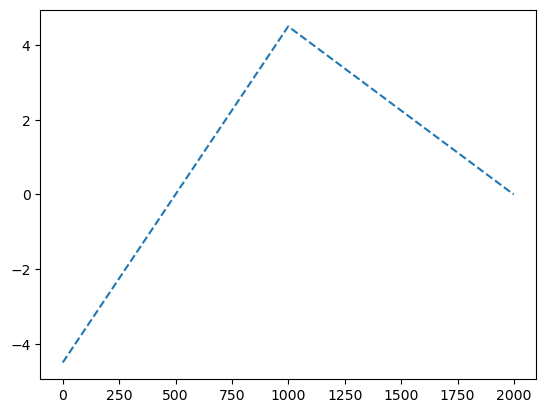

In [39]:
y = x*0 
y[x<0] = (9*x+4.5)[x<0]
y[x>0] = (-4.5*x+4.5)[x>0]

plt.plot(y,'--')

In [42]:
df = pd.read_csv("https://raw.githubusercontent.com/guebin/DL2024/main/posts/dnnex.csv")
x = torch.tensor(df.x).float().reshape(-1,1)
y = torch.tensor(df.y).float().reshape(-1,1)
prob = torch.tensor(df.prob).float().reshape(-1,1)

torch.manual_seed(43052)
net = torch.nn.Sequential(
    torch.nn.Linear(1,2),
    torch.nn.ReLU(),
    torch.nn.Linear(2,1),
    torch.nn.Sigmoid()
)
loss_fn = torch.nn.BCELoss()
optimizr = torch.optim.Adam(net.parameters())
#---#
for epoc in range(3000):
    ## 
    yhat = net(x)
    ## 
    loss = loss_fn(yhat,y)
    ## 
    loss.backward()
    ## 
    optimizr.step()
    optimizr.zero_grad()

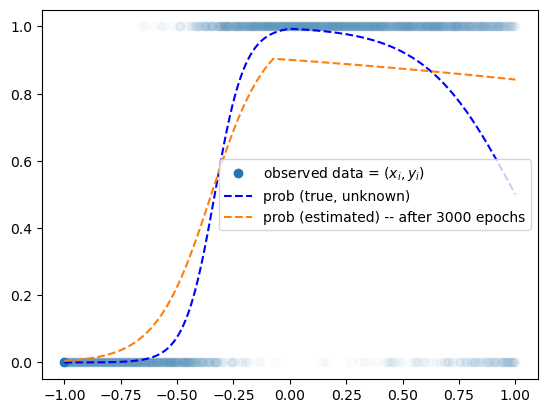

In [43]:
plt.plot(x,y,'o',alpha=0.02)
plt.plot(x[0],y[0],'o',label= r"observed data = $(x_i,y_i)$",color="C0")
plt.plot(x,prob,'--b',label= r"prob (true, unknown)")
plt.plot(x,net(x).data,'--',label="prob (estimated) -- after 3000 epochs")
plt.legend()

In [44]:
for epoc in range(3000):
    ## 
    yhat = net(x)
    ## 
    loss = loss_fn(yhat,y)
    ## 
    loss.backward()
    ## 
    optimizr.step()
    optimizr.zero_grad()

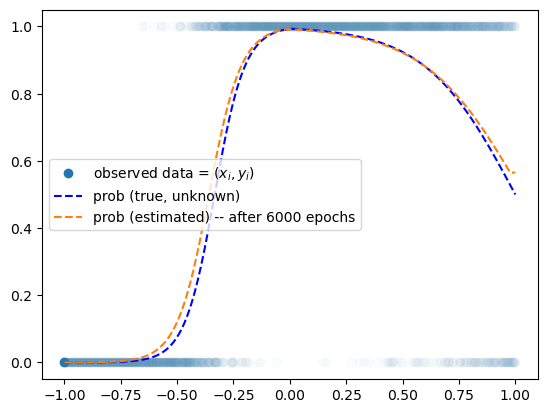

In [45]:
plt.plot(x,y,'o',alpha=0.02)
plt.plot(x[0],y[0],'o',label= r"observed data = $(x_i,y_i)$",color="C0")
plt.plot(x,prob,'--b',label= r"prob (true, unknown)")
plt.plot(x,net(x).data,'--',label="prob (estimated) -- after 6000 epochs")
plt.legend()

ReLU에 대해서는 깊게 알기보단 그래프를 꺾을 수 있다

그 꺾는다는 의미는 표현력을 높인다고 생각하는 것이 좋다.

로지스틱의 한계를 마주했을 때 그저 증가함수는 표현을 못 하는 그래프들이 있기때문에 문제였는데

이제 ReLU를 이용해서 꺾인 선 그래프도 그릴 수 있게 되었고 그것으로 적합해서 맞춰나가면 해결할 수 있게 되었다.

즉 그래프의 표현력이 늘었다. 그렇다면 모든 그래프도 적합할 수 있을 거 같은데?

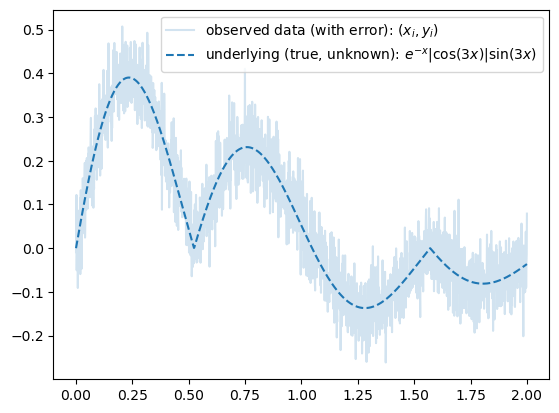

In [50]:
torch.manual_seed(21345)
x = torch.linspace(0,2,2000).reshape(-1,1)
eps = torch.randn(2000).reshape(-1,1)*0.05
fx = torch.exp(-1*x)* torch.abs(torch.cos(3*x))*(torch.sin(3*x))
y = fx + eps

plt.plot(x,y,label=r"observed data (with error): $(x_i,y_i)$", alpha=0.2)
plt.plot(x,fx,'--',color="C0",label=r"underlying (true, unknown): $e^{-x}|\cos(3x)|\sin(3x)$")
plt.legend()

위의 문제는 로지스틱이 아니라 회귀선을 맞춰보는 느낌이 강하기에 MSELoss를 사용

In [51]:
#torch.manual_seed(43052)
net = torch.nn.Sequential(
    torch.nn.Linear(1,1024),
    torch.nn.ReLU(),
    torch.nn.Linear(1024,1)
)
loss_fn = torch.nn.MSELoss()
optimizr = torch.optim.Adam(net.parameters())
#--#
for epoc in range(5000):
    ## 1
    yhat = net(x)
    ## 2
    loss = loss_fn(yhat,y)
    ## 3
    loss.backward()
    ## 4
    optimizr.step()
    optimizr.zero_grad()

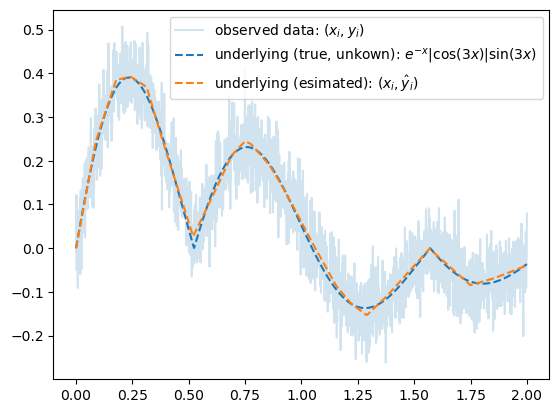

In [52]:
plt.plot(x,y,label=r"observed data: $(x_i,y_i)$", alpha=0.2)
plt.plot(x,fx,'--',color="C0",label=r"underlying (true, unkown): $e^{-x}|\cos(3x)|\sin(3x)$")
plt.plot(x,yhat.data,'--',color="C1",label=r"underlying (esimated): $(x_i,\hat{y}_i)$")
plt.legend()

`-` 이렇게 복잡한 것도 잘 맞춰준다.

# 8. 그럼 무적인가? (시벤코정리)

치명적인 문제 : Overfiiting

표현력은 무한하지만 오차까지 적합해버리는 문제가 있다

이러한 문제를 해결하기 위해 드랍아웃이라는 기법이 존재함

In [55]:
u = torch.randn(20).reshape(10,2)
u

tensor([[ 0.9303, -1.4108],
        [ 0.1033,  0.3010],
        [-0.3732,  2.3353],
        [ 0.2152,  0.1908],
        [-0.1696,  1.1762],
        [-1.4862, -0.0343],
        [-0.8385,  0.3719],
        [ 0.9422,  0.9081],
        [-1.3018, -0.7977],
        [ 0.1008,  0.2014]])

In [56]:
d = torch.nn.Dropout(0.9)
d(u)

tensor([[ 0.0000, -0.0000],
        [ 1.0332,  0.0000],
        [-0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [-1.6961,  0.0000],
        [-0.0000, -0.0000],
        [-8.3853,  0.0000],
        [ 0.0000,  0.0000],
        [-0.0000, -0.0000],
        [ 0.0000,  2.0141]])

`-` 드랍아웃

90%의 드랍아웃: 드랍아웃층의 입력 중 임의로 90%를 골라서 결과를 0으로 만든다. + 그리고 0이 되지않고 살아남은 값들은 10배 만큼 값이 커진다.

의미: each iteration (each epoch x) 마다 학습에 참여하는 노드가 랜덤으로 결정됨.

느낌: 모든 노드가 골고루 학습가능 + 한 두개의 특화된 능력치가 개발되기 보다 평균적인 능력치가 전반적으로 개선됨

배깅과 랜덤포레스트의 느낌으로 오버피팅을 해결함